## Yves Ngenzi 
## Pattern Recognition Spring 2020


In [0]:
import numpy as pd 
import matplotlib.pyplot as plt 
import os 
import cv2
from os import listdir
from numpy import asarray
from numpy import save
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import itertools


In [2]:
#from google.colab import  files
#uploaded=files.upload()
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [3]:
# import data from the google drive 
import os
Data=os.chdir("/content/gdrive/My Drive/Coins")
Data1=("/content/gdrive/My Drive/Coins")
os.getcwd()

'/content/gdrive/My Drive/Coins'

In [0]:
# make your data a list 
Data= "/content/gdrive/My Drive/Coins"
files = os.listdir(Data)
files1=files.copy()

In [5]:
#Lets print some of the data we have of coins to see if we are right 
Data_names = os.listdir(Data)
print(Data_names[:3])
Data_names.sort()
print(Data_names[:3])

['Q38 copy.jpeg', 'Q45.jpeg', 'Q40 copy.jpeg']
['D0 copy.jpeg', 'D1 copy.jpeg', 'D10.jpeg']


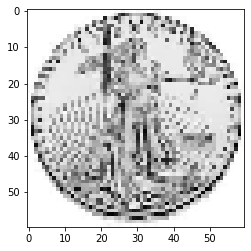

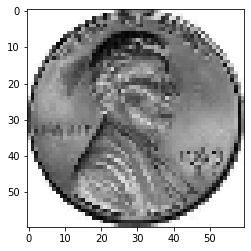

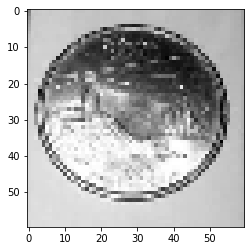

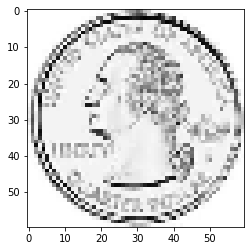

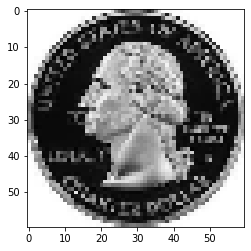

...

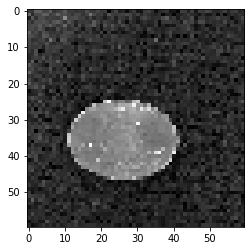

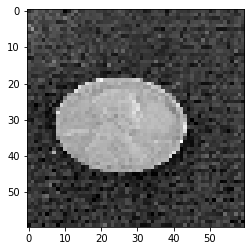

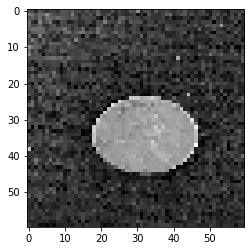

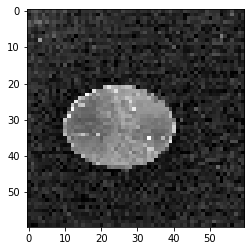

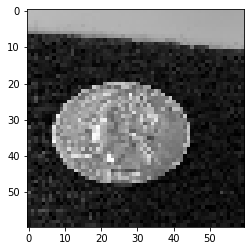

error: ignored

In [50]:
# chage the size of the data and turn them gray 
#store the gray images and name of those images
# Plot those images too for us to see 
img_size=80  
image_name=[] 
Gray_images=[]
for img in files1:
  img_array=cv2.imread(img,cv2.IMREAD_GRAYSCALE)
  new_array=cv2.resize(img_array,(img_size, img_size)) 
  plt.imshow(new_array,cmap='gray')
  plt.show()
  Gray_images.append([new_array])
  image_name.append([img])
  
  
  

In [0]:
# check what ar those gray images and their names 
Gray_images;
image_name;

In [0]:
# convert Gray images to strings
Z=image_name_string=str(image_name)

In [238]:
Z

"[['Q38 copy.jpeg'], ['Q45.jpeg'], ['Q40 copy.jpeg'], ['Q30.jpeg'], ['Q5 copy.jpeg'], ['Q46.jpeg'], ['Q29.jpeg'], ['Q28.jpeg'], ['Q25.jpeg'], ['Q34.jpeg'], ['Q26 copy.jpeg'], ['Q4 copy.jpeg'], ['Q44 copy.jpeg'], ['Q6.jpeg'], ['Q9 copy.jpeg'], ['Q49 copy.jpeg'], ['Q56 copy.jpeg'], ['Q52.jpeg'], ['Q32.jpeg'], ['Q41 copy.jpeg'], ['Q39.jpeg'], ['Q36 copy.jpeg'], ['Q31.jpeg'], ['Q1.jpeg'], ['Q48.jpeg'], ['Q53.jpeg'], ['Q55.jpeg'], ['Q35 copy.jpeg'], ['Q33 copy.jpeg'], ['Q22.jpeg'], ['Q51 copy.jpeg'], ['Q54.jpeg'], ['Q42 copy.jpeg'], ['Q20 copy.jpeg'], ['Q43.jpeg'], ['Q21 copy.jpeg'], ['Q50 copy.jpeg'], ['Q69.jpeg'], ['Q12 copy.jpeg'], ['Q13.jpeg'], ['Q77 copy.jpeg'], ['Q57 copy.jpeg'], ['Q67 copy.jpeg'], ['Q62.jpeg'], ['Q65 copy.jpeg'], ['Q75.jpeg'], ['Q72.jpeg'], ['Q81.jpeg'], ['Q19 copy.jpeg'], ['Q15.jpeg'], ['Q66.jpeg'], ['Q16 copy.jpeg'], ['Q76 copy.jpeg'], ['Q79.jpeg'], ['Q78.jpeg'], ['Q73.jpeg'], ['Q58.jpeg'], ['Q70 copy.jpeg'], ['Q83.jpeg'], ['Q68 copy.jpeg'], ['Q14 copy.jpeg'], ['Q8

In [0]:
# create 4 letters prefixes for the coins
q='Q'
p='P'
n='N'
d='D'

In [0]:
#Loop through image names to separate coins according to their names

quarters=[]
Nickles=[]
Dimes=[]
Pennies=[]
for i in Z:
   if q in i:
     quarters.append([q])
   elif p in i: 
      Pennies.append([p])
   elif n in i:
      Nickles.append([n])
   elif d in i:
      Dimes.append([d])

In [331]:
print('quarters',len(quarters))
print('nickels',len(Nickles))
print('Dime',len(Dimes))
print('Pennies',len(Pennies))

quarters 90
nickels 120
Dime 97
Pennies 147


In [0]:
# put all the prefixes letters together
B=(quarters+Nickles+Dimes+Pennies)

In [0]:
B;

In [0]:
# decrease the shape of the added coins from two D to one D 
a=np.concatenate(B)

In [0]:
#a=pd.factorize(a)

In [336]:
np.shape(a)

(454,)

In [0]:
c=pd.factorize(a)

In [0]:
c;

In [0]:
a;

In [58]:
# give the shape of the gray image 
np.shape(Gray_images)


(454, 1, 60, 60)

In [0]:
#convert the Gray_image shape into (454,80,80)
Gray_images1=np.concatenate(Gray_images)

In [60]:
# Gray image shape is changed as we want it 
np.shape(Gray_images1)

(454, 60, 60)

# Data Processing 

In [0]:
# import libraries to help us find the radius of the circle
from skimage import data, color
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
from skimage.util import img_as_ubyte

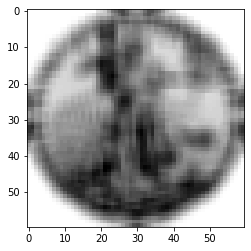

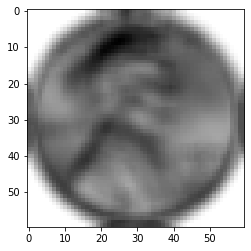

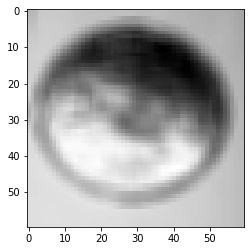

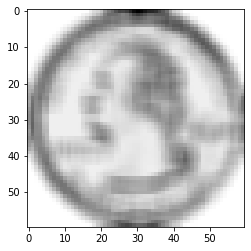

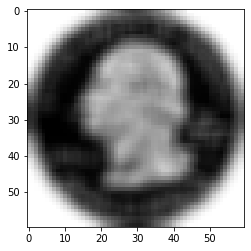

...

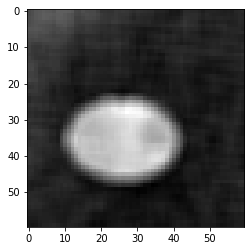

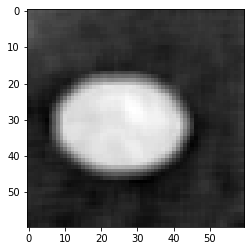

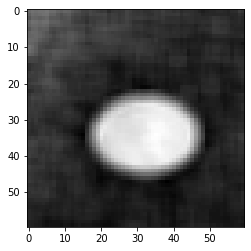

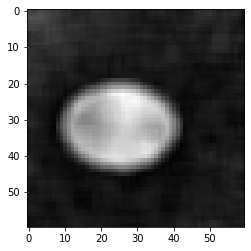

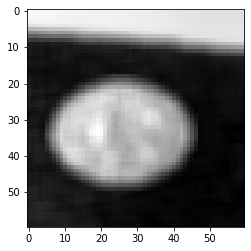

In [62]:
# brury Gray_images for better radius measurement 
# Store the Brury images 
store_blur_image=[]
for image in Gray_images1:
  plt.rcParams["figure.figsize"] = (10,4)
  img = cv2.GaussianBlur((image), (5,5), cv2.BORDER_DEFAULT)
  plt.imshow(img,cmap='gray')
  plt.show()
  store_blur_image.append([img])
 
 


In [0]:
# change the shape of the blury images for better analysis 
store_blur_image=np.concatenate(store_blur_image)

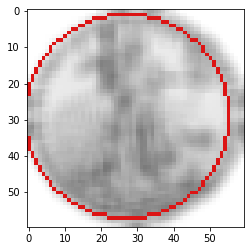

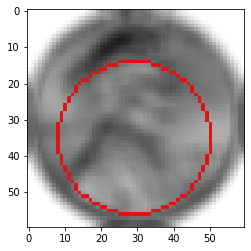

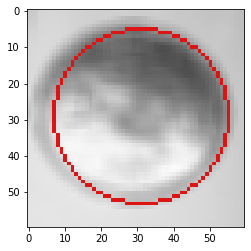

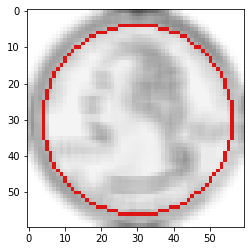

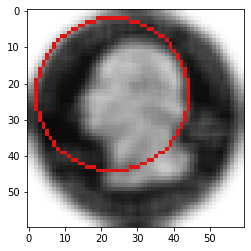

...

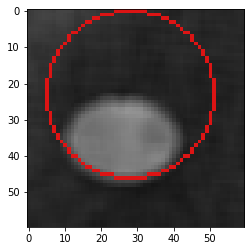

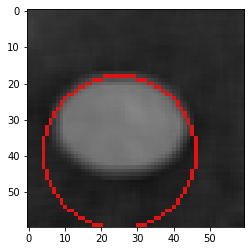

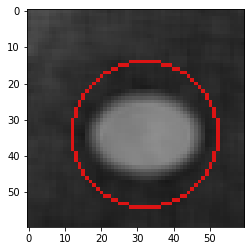

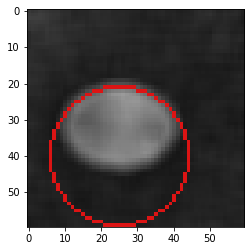

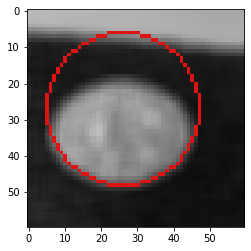

In [110]:
# Detect radii 
# store the radii 
 store_radius=[]
for image in store_blur_image: 
  edges = canny(image, sigma=1, low_threshold=10, high_threshold=20)
  hough_radii = np.arange(19,35,1)
  hough_res = hough_circle(edges, hough_radii)

  # Select the most prominent circle.
  accums,cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,total_num_peaks=1)
  
  # Draw them
 
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
  image = color.gray2rgb(image)
  for center_y, center_x, radius in zip(cy, cx, radii):
     circy, circx = circle_perimeter(center_y, center_x, radius,shape=image.shape)
     image[circy, circx] = (220,20,20)
     ax.imshow(image, cmap=plt.cm.gray)
     plt.show()
     store_radius.append([radii])


In [0]:
# stored radius
store_radius;

In [0]:
 # create the list of Radius
all_circs_rounded = np.uint(np.around(store_radius))

In [0]:
#print(all_circs_rounded);
#print(all_circs_rounded.shape);


In [0]:
# make 2D array
Two_D = np.concatenate(all_circs_rounded ) 

In [0]:

Two_D;

In [0]:
# make 1 D array 
One_D=np.concatenate(Two_D) 

In [0]:
# put the smilar radius together 
  y=pd.factorize(One_D) 

In [0]:
#factorised results 
y;

In [0]:
y=np.reshape(y,(-1,1))

In [0]:
y;

## Training Data using Radius 

In [0]:
# accumulated radius of the coins is our training data
X=all_circs_rounded

In [0]:
#scale the data 
X = X/40;
#print(np.round(X));


In [0]:
# make a 2D 1x64 array for sklearn 
X_train=[]
for img in X:
  X0=img.reshape(1,-1)  
  X_train.append([X0])

In [0]:
# Training data set 
X_train;

In [0]:
# make three array 
make_twod_array= np.concatenate((X_train)) 
V=make_twod_array


In [0]:
#make two D array
V= np.concatenate((make_twod_array))  


In [0]:
#reshape the radius into 2 dimansion for the classfier 
V=V.reshape(-1,1)

In [262]:
np.shape(V)

(454, 1)

 Let us usE Neural Network for classfication

In [0]:
# neural network classfier 
from sklearn.neural_network import MLPClassifier 

In [375]:
clf =MLPClassifier(hidden_layer_sizes=(5),max_iter=3000, random_state=42)
clf.fit(V,a)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=5, learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=3000,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=42, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [371]:
clf.score(V,a)

0.3237885462555066

## Neural Network was scored 32% 

In [0]:
clf.loss_curve_[-30:];

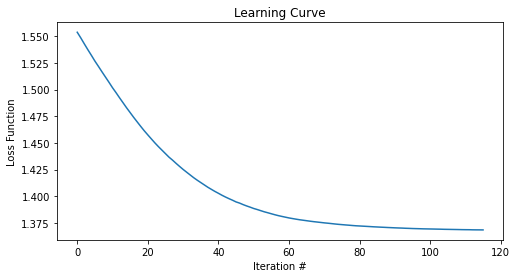

In [267]:
plt.figure()
plt.plot(clf.loss_curve_)
plt.title('Learning Curve')
plt.xlabel('Iteration #')
plt.ylabel('Loss Function')
plt.show()

## WE are decreasing the Losses the more we irritrate 

## We tried Naive Bayes 

In [0]:
from sklearn import naive_bayes

In [367]:
clf1 = naive_bayes.GaussianNB()
clf1.fit(V,a)

GaussianNB(priors=None, var_smoothing=1e-09)

In [369]:
clf1.score(V,a)

0.3854625550660793

## Naive Baise classified 38% 

In [271]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(V,a)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [373]:
knn.score(V,a)

0.2753303964757709

## Neirest Neighbor also classfied a 27percent

# Let us now use test Data to test our classfiers 

In [153]:
import os
Data_test=os.chdir("/content/gdrive/My Drive/test")
os.getcwd()

'/content/gdrive/My Drive/test'

In [0]:
Data_test="/content/gdrive/My Drive/test"
files_test = os.listdir(Data_test)

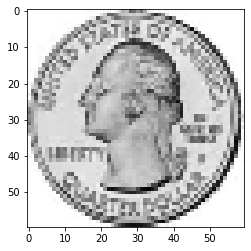

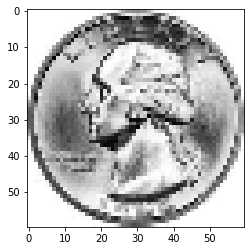

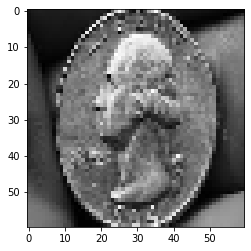

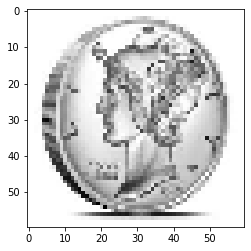

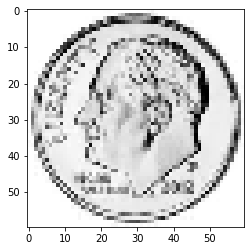

...

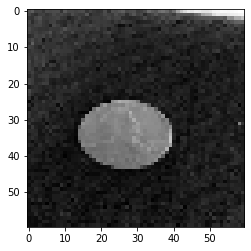

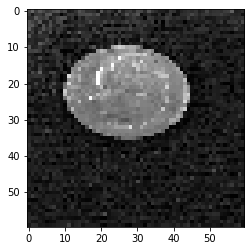

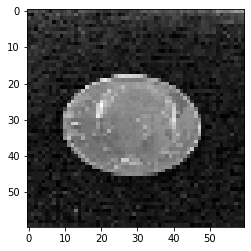

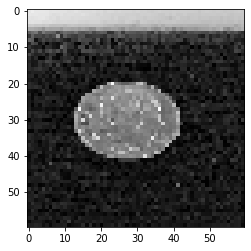

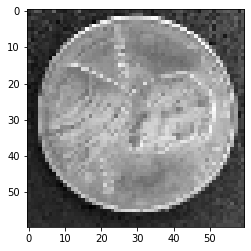

In [250]:
# create a smilar shape but with a diffent size
img_size=60   
Gray_images_test=[]
Image_test_names=[]
for img in files_test:
  img_array=cv2.imread(img,cv2.IMREAD_GRAYSCALE)
  new_array=cv2.resize(img_array,(img_size, img_size)) 
  plt.imshow(new_array,cmap='gray')
  plt.show()
  Gray_images_test.append([new_array])
  Image_test_names.append([img])


In [0]:
K=image_name_string_test=str( Image_test_names)

In [0]:
K;

In [0]:
#Loop through image names to separate coins according to their names

quarters=[]
Nickles=[]
Dimes=[]
Pennies=[]
for i in K:
   if q in i:
     quarters.append([q])
   elif p in i: 
      Pennies.append([p])
   elif n in i:
      Nickles.append([n])
   elif d in i:
      Dimes.append([d])

In [254]:
print('quarters',len(quarters))
print('nickels',len(Nickles))
print('Dime',len(Dimes))
print('Pennies',len(Pennies))

quarters 13
nickels 4
Dime 5
Pennies 25


In [0]:
# these are gray images for testing the classfier 
Gray_images_test;

In [0]:
Gray_images_test=np.concatenate(Gray_images_test)

# Now lets extract Radius features of the  of test images 

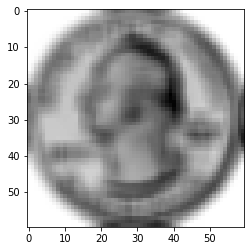

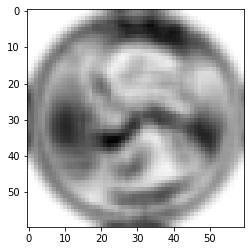

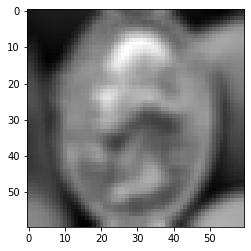

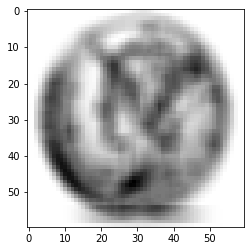

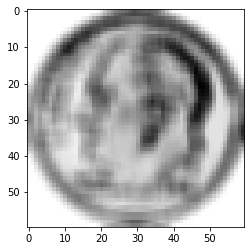

...

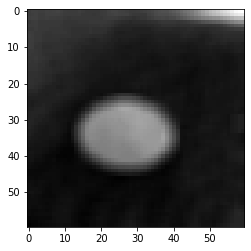

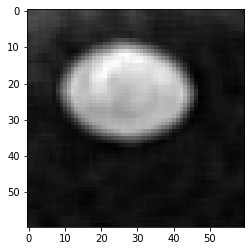

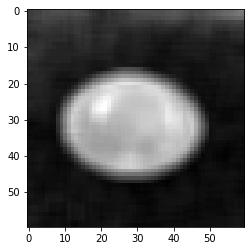

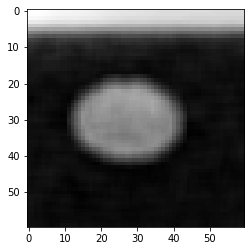

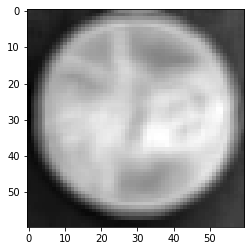

In [166]:
# to use circle only we have to brury image
store_blur_image_test=[]
for image in Gray_images_test:
  plt.rcParams["figure.figsize"] = (8,4)
  img = cv2.GaussianBlur(image, (5,5), cv2.BORDER_DEFAULT)
  plt.imshow(img,cmap='gray')
  plt.show()
  store_blur_image_test.append([img])
 

In [0]:
store_blur_image_test=np.concatenate(store_blur_image_test)

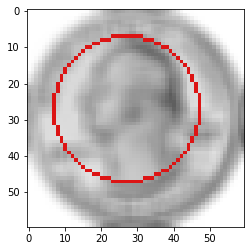

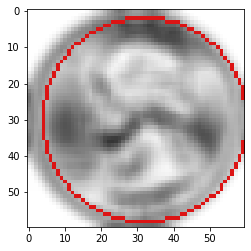

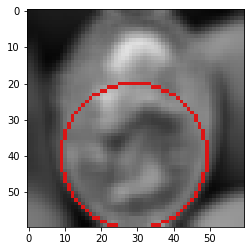

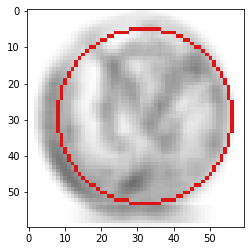

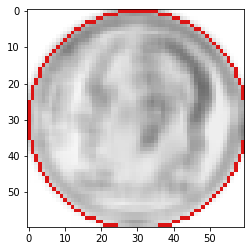

...

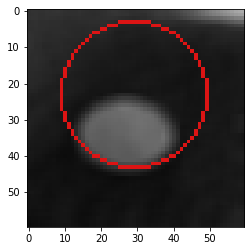

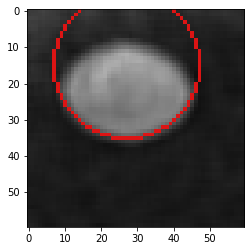

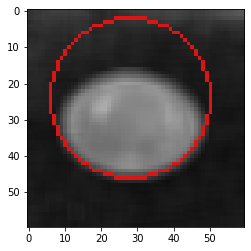

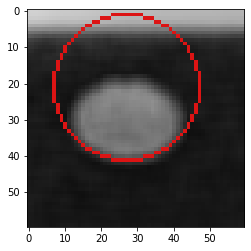

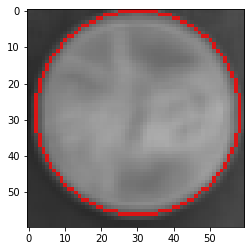

In [168]:
# Detect radii 
 store_radius_test=[]
for image in store_blur_image_test: 
  edges = canny(image, sigma=1, low_threshold=10, high_threshold=20)
  hough_radii = np.arange(20,40,2)
  hough_res = hough_circle(edges, hough_radii)

  # Select the most prominent circle.
  accums,cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,total_num_peaks=1)
  
  # Draw them
 
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
  image = color.gray2rgb(image)
  for center_y, center_x, radius in zip(cy, cx, radii):
     circy, circx = circle_perimeter(center_y, center_x, radius,shape=image.shape)
     image[circy, circx] = (220,20,20)
     ax.imshow(image, cmap=plt.cm.gray)
     plt.show()
     store_radius_test.append([radii])

In [0]:
 # create the list of Radius
all_circs_rounded_test = np.uint(np.around(store_radius_test))

In [0]:
# print the radius to know what one is working with 
#print(all_circs_rounded_test);
#print(all_circs_rounded_test.shape);

In [0]:
# make 2D array
Two_D_test = np.concatenate(all_circs_rounded_test ) 

In [172]:
np.shape(Two_D_test)

(47, 1)

# Neural network Prediction  

In [278]:
clf.predict(Two_D_test) 

array(['P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P'], dtype='<U1')

In [0]:
q='Q'
p='P'
n='N'
d='D'


In [0]:
# make srings the predicted elements
H=str(clf.predict(Two_D_test)) 

In [276]:
quarters=[]
Nickles=[]
Dimes=[]
Pennies=[]
for i in H:
  if q in i:
    quarters.append([q])
  elif p in i: 
    Pennies.append([p])
  elif n in i:
    Nickles.append([n])
  elif d in i:
     Dimes.append([d])

print( "The number of quarters are:", len(quarters))

print( "The number of Pennies are:", len(Pennies))

print( "The number of Nickles are:", len(Nickles))

print( "The number of Dimes are:", len(Dimes))

   

    

The number of quarters are: 0
The number of Pennies are: 47
The number of Nickles are: 0
The number of Dimes are: 0


# Bayes classfiction predictions 

In [179]:
clf1.predict(Two_D_test)

array(['P', 'N', 'P', 'P', 'N', 'P', 'P', 'P', 'N', 'N', 'P', 'N', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P', 'P',
       'P', 'P', 'P', 'P', 'P', 'P', 'P', 'N'], dtype='<U1')

In [0]:
R=str(clf1.predict(Two_D_test)) # make the strings of predicted values by byes classifier 

In [0]:
qu='Q'
pe='P'
ni='N'
di='D'

In [185]:
a=[]
b=[]
c=[]
e=[]

for i in R:
  if qu in i:
    a.append([qu])
  elif pe in i: 
    b.append([pe])
  elif ni in i:
    c.append([ni])
  elif di in i:
     e.append([di])

print( "The number of quarters are:", len(a))

print( "The number of Pennies  are:", len(b))

print( "The number of Nickles are:", len(c))

print( "The number of Dimes are:", len(e))

The number of quarters are: 0
The number of Pennies  are: 41
The number of Nickles are: 6
The number of Dimes are: 0


# kneigbor prediction

In [0]:
# kneigbor prediction
Z=knn.predict(Two_D_test) 

In [0]:
#make the predicted values strings
Z=str(knn.predict(Two_D_test)) 

In [190]:
u=[]
v=[]
w=[]
m=[]

for i in Z:
  if q in i:
    u.append([q])
  elif p in i: 
    v.append([p])
  elif n in i:
    w.append([n])
  elif d in i:
    m.append([d])

print( "The number of quarters are:", len(u))

print( "The number of Pennies are:", len(v))

print( "The number of Nickles are:", len(w))

print( "The number of Dimes are:", len(m))

The number of quarters are: 2
The number of Pennies are: 10
The number of Nickles are: 1
The number of Dimes are: 34
